# PCA

In [26]:
import os
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from pyhdf.SD import SD, SDC
import pprint
import matplotlib.pyplot as plt
%matplotlib inline

In [34]:
#os.chdir('/home/jvillarreal/Documents/phd/dataset')

In [35]:
!ncdump -h Only_valid_range_sample_radiances_38bands_MYD021KM.A2013122.1140.L1B.hdf

netcdf Only_valid_range_sample_radiances_38bands_MYD021KM.A2013122.1140.L1B {
dimensions:
	fakeDim0 = 38 ;
	fakeDim1 = 2030 ;
	fakeDim2 = 1354 ;
	fakeDim3 = 38 ;
variables:
	double radiances_38bands(fakeDim0, fakeDim1, fakeDim2) ;
		radiances_38bands:_FillValue = 0. ;
		radiances_38bands:units = "W/m^2/micron/sr" ;
	double bands_radiances_38bands(fakeDim3) ;
}


In [182]:
# Radiances dataset - subset

modis_file = 'Only_valid_range_sample_subset_radiances_38bands_MYD021KM.A2013122.1140.L1B.hdf'
file = SD(modis_file, SDC.READ)
datasets_dict = filehdf.datasets()

for idx,sds in enumerate(datasets_dict.keys()):
    print(idx,sds)
    


0 subset_radiances_38bands
1 bands_radiances_38bands


In [183]:
sds_subset_radiances = file.select('subset_radiances_38bands')
sds_data_subset_radiances=sds_subset_radiances.get() 
print(sds_data_subset_radiances.shape)

(38, 600, 600)


In [187]:
sds_data_subset_radiances= np.ma.masked_array(sds_data_subset_radiances, np.isnan(sds_data_subset_radiances))
#X_flated= np.ma.masked_array(X_flated, np.isnan(X_flated))
#X_flat= np.ma.masked_array(X_flat, np.isnan(X_flat))
X_data = sds_data_subset_radiances

np.shape(X_data),X_data.max(), X_data.min()

((38, 600, 600), 587.3596593365073, -0.6400475815622997)

In [188]:
X_flated = sds_data_subset_radiances.transpose(1,2,0).reshape(-1,sds_data_subset_radiances.shape[0])

print(X_flated.shape,X_flated.max(), X_flated.min())

(360000, 38) 587.3596593365073 -0.6400475815622997


In [189]:
X_flat = np.zeros((sds_data_subset_radiances[0,:,:].size,n_bands))

for i in range(n_bands):
    X_flat[:,i] = sds_data_subset_radiances[i,:,:].flatten()  # covert 2d to 1d array 
X_flat.shape,X_flat.max()  

((360000, 38), nan)

In [190]:
(X_flated== X_flat).all() ##si uno tiene mascara el otro no importa q tenga nan

True

In [126]:
df2=pd.DataFrame(X_flat)
df2.shape

(360000, 38)

In [127]:
df=pd.DataFrame(X_flated)
df.shape

(360000, 38)

In [114]:
for i in range(n_bands):
    count_nan = df2[i].isnull().sum()
    print (i,'Count of NaN: ' + str(count_nan))

0 Count of NaN: 0
1 Count of NaN: 9894
2 Count of NaN: 0
3 Count of NaN: 0
4 Count of NaN: 0
5 Count of NaN: 144000
6 Count of NaN: 0
7 Count of NaN: 111598
8 Count of NaN: 275068
9 Count of NaN: 296099
10 Count of NaN: 302834
11 Count of NaN: 309724
12 Count of NaN: 321523
13 Count of NaN: 337592
14 Count of NaN: 320805
15 Count of NaN: 341258
16 Count of NaN: 332499
17 Count of NaN: 333006
18 Count of NaN: 39685
19 Count of NaN: 0
20 Count of NaN: 0
21 Count of NaN: 0
22 Count of NaN: 0
23 Count of NaN: 0
24 Count of NaN: 0
25 Count of NaN: 0
26 Count of NaN: 0
27 Count of NaN: 0
28 Count of NaN: 0
29 Count of NaN: 0
30 Count of NaN: 0
31 Count of NaN: 0
32 Count of NaN: 0
33 Count of NaN: 0
34 Count of NaN: 0
35 Count of NaN: 0
36 Count of NaN: 0
37 Count of NaN: 36000


In [129]:
df.describe()

,0,1,2,3,4,5,6,7,8,9,...,28,29,30,31,32,33,34,35,36,37
count,360000.000000,350106.000000,360000.000000,360000.000000,360000.000000,216000.000000,360000.000000,248402.000000,84932.000000,63901.000000,...,360000.000000,360000.000000,360000.000000,360000.000000,360000.000000,360000.000000,360000.000000,360000.000000,360000.000000,324000.000000
mean,213.104687,143.409759,291.906658,247.421640,62.049135,20.351211,4.544092,209.332876,97.616663,63.961063,...,1.021706,2.016703,4.304391,3.529373,5.070572,4.892849,3.799155,3.305265,2.966690,2.416078
std,100.609153,59.581559,125.133174,112.202384,24.661593,9.765287,2.419798,87.708015,45.477488,25.802137,...,0.170564,0.486689,1.416061,0.695537,1.448213,1.302279,0.676476,0.442698,0.297060,0.097663
min,9.904950,2.544103,44.055010,20.923815,0.437096,0.054349,0.024858,56.999400,48.912753,36.203265,...,0.451742,0.652888,1.142015,1.790126,1.751366,1.852851,1.946909,1.966124,2.003872,2.033204
25%,152.646837,111.266096,215.442114,179.284657,51.761115,13.299102,2.609263,127.126977,58.086520,42.764784,...,0.896322,1.629185,3.089584,2.952617,3.827441,3.775412,3.239968,2.954820,2.738854,2.347955
50%,242.520428,162.387203,327.158237,279.502712,69.542978,20.155178,4.317837,237.533010,78.402466,53.297855,...,1.020399,2.060080,4.591485,3.703503,5.336663,5.118978,3.928078,3.399251,3.032988,2.437732
75%,289.707205,189.305180,387.994952,333.263448,78.612722,28.709648,6.652832,284.896662,133.993370,80.502583,...,1.184303,2.472115,5.289512,4.039126,6.125441,5.857283,4.373789,3.702670,3.233968,2.501180
max,457.663977,227.603324,587.359659,518.580538,115.115211,47.500676,11.925217,322.009601,197.145038,130.263793,...,1.340784,3.072943,8.458211,5.601846,9.308539,8.715715,5.205660,4.012215,3.409493,2.578148


#### to decide what to do with the nan !!!!!!!

In [47]:
sds_subset_bands=file.select('bands_radiances_38bands').get() 
print(sds_subset_bands.shape)

(38,)


### old code considering values higher that valid range

### Split the dataset between a training and testing dataset:


In [61]:
#from sklearn.model_selection import train_test_split
#df_train, df_test = train_test_split(X_scaled, test_size = .3, random_state = 42)
#df_train_2, df_test_2 = train_test_split(MB_matrix_scaled, test_size = .3, random_state = 42)
df_train = X_data[:,:,:400]
n_bands=len(df_train[:,0,0])
img_shape = df_train.shape[1:]

print(df_train.shape,img_shape,df_train.max()) ##########no seria adecuado serapar asi xq de ahi nose como obtener una imagen

(38, 600, 400) (600, 400) 587.3596593365073


### Data Preparation (1d, scaling and standardization)


In [56]:
# Convert 2d band array in 1-d to make them as feature vectors and Standardization
#https://towardsdatascience.com/principal-component-analysis-in-depth-understanding-through-image-visualization-892922f77d9f
MB_matrix_scaled = np.zeros((df_train[0,:,:].size,n_bands))
X_data_flat = np.zeros((df_train[0,:,:].size,n_bands))

for i in range(n_bands):
    X_data_flat[:,i] = df_train[i,:,:].flatten()  # covert 2d to 1d array 
    MB_arrayStd = (X_data_flat[:,i] - X_data_flat[:,i].mean())/X_data_flat[:,i].std()  #zscore
    MB_matrix_scaled[:,i] = MB_arrayStd

print(np.shape(MB_matrix_scaled))

(240000, 38)


In [63]:
print(df_train.mean(), df_train.std() )

54.53610710229311 98.82007420686274


In [62]:
print(X_data_flat.mean(), X_data_flat.std(), MB_matrix_scaled.mean(), MB_matrix_scaled.std())

nan nan nan nan


In [65]:
import pandas as pd

df=pd.DataFrame(MB_matrix_scaled)

In [66]:
df.describe()

,0,1,2,3,4,5,6,7,8,9,...,28,29,30,31,32,33,34,35,36,37
count,2.400000e+05,0.0,2.400000e+05,2.400000e+05,2.400000e+05,0.0,2.400000e+05,0.0,0.0,0.0,...,2.400000e+05,2.400000e+05,2.400000e+05,2.400000e+05,2.400000e+05,2.400000e+05,2.400000e+05,2.400000e+05,2.400000e+05,0.0
mean,7.299011e-15,NaN,-2.073767e-16,1.029843e-15,-9.685808e-16,NaN,6.209781e-15,NaN,NaN,NaN,...,-6.700001e-15,-3.747243e-15,1.160176e-14,6.330168e-16,3.141661e-15,-1.643485e-14,7.986747e-15,1.852382e-14,1.385814e-14,NaN
std,1.000002e+00,NaN,1.000002e+00,1.000002e+00,1.000002e+00,NaN,1.000002e+00,NaN,NaN,NaN,...,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,NaN
min,-2.455486e+00,NaN,-2.421092e+00,-2.443116e+00,-2.868694e+00,NaN,-1.866185e+00,NaN,NaN,NaN,...,-3.040356e+00,-2.486381e+00,-2.145347e+00,-2.361502e+00,-2.195277e+00,-2.225722e+00,-2.504051e+00,-2.727204e+00,-2.915849e+00,NaN
25%,-4.579348e-01,NaN,-4.827424e-01,-4.709098e-01,-2.586918e-01,NaN,-7.998453e-01,NaN,NaN,NaN,...,-7.634168e-01,-8.340864e-01,-8.789483e-01,-8.619486e-01,-8.790971e-01,-8.787654e-01,-8.533961e-01,-8.293375e-01,-8.101707e-01,NaN
50%,2.408736e-01,NaN,2.305755e-01,2.371666e-01,2.664698e-01,NaN,-1.628384e-01,NaN,NaN,NaN,...,-2.773036e-02,-2.228851e-03,6.420593e-02,1.508808e-01,3.028101e-02,1.936104e-02,5.541696e-02,9.233508e-02,1.131359e-01,NaN
75%,7.090236e-01,NaN,7.188522e-01,7.129782e-01,5.992874e-01,NaN,9.007043e-01,NaN,NaN,NaN,...,8.897748e-01,9.998316e-01,7.904347e-01,7.988208e-01,8.298565e-01,8.522370e-01,9.303020e-01,9.599189e-01,9.650730e-01,NaN
max,2.512175e+00,NaN,2.433680e+00,2.489680e+00,2.271167e+00,NaN,3.102958e+00,NaN,NaN,NaN,...,1.841573e+00,2.146307e+00,3.484855e+00,3.330279e+00,3.317102e+00,3.295402e+00,2.231384e+00,1.680381e+00,1.552887e+00,NaN


###  StandardScaler

In [9]:
from sklearn import preprocessing
scaler = preprocessing.StandardScaler().fit(X_data_flat)

X_scaled = scaler.transform(X_data_flat)
    

#### difference between preprocessing.StandardScaler and numpy


In [10]:
print(MB_matrix_scaled[0,0])
print(X_scaled[0,0])
print(MB_matrix_scaled[0,0]-X_scaled[0,0])
print(np.mean(np.abs(MB_matrix_scaled-X_scaled)))

0.4911951004126568
0.4911951004126543
2.4980018054066022e-15
5.433720844138287e-12


In [11]:
print(MB_matrix_scaled[0,0])
print(X_scaled[0,0])
print(MB_matrix_scaled[0,0]-X_scaled[0,0])
print(np.mean(np.abs(MB_matrix_scaled-X_scaled)))

0.4911951004126568
0.4911951004126543
2.4980018054066022e-15
5.433720844138287e-12


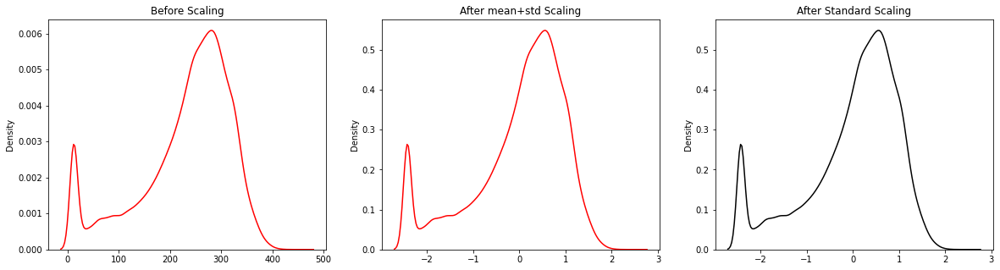

In [12]:
import seaborn as sns 
#A kernel density estimate (KDE) plot is a method for visualizing the distribution of observations 
#in a dataset, analagous to a histogram. KDE represents the data using a continuous probability density curve in one or more dimensions.

fig, (ax1, ax2, ax3) = plt.subplots(ncols =3 , figsize =(20, 5))
ax1.set_title('Before Scaling') 
sns.kdeplot(X_data_flat[:,0], ax = ax1, color ='r')

ax2.set_title('After mean+std Scaling') 
sns.kdeplot(MB_matrix_scaled[:,0], ax = ax2, color ='red')

ax3.set_title('After Standard Scaling') 
sns.kdeplot(X_scaled[:,0], ax = ax3, color ='black')

plt.show()

In [15]:
# Covariance
np.set_printoptions(precision=3)
cov = np.cov(X_scaled.transpose())

# Eigen Values
EigVal,EigVec = np.linalg.eig(cov)

print("Eigenvalues:\n\n", EigVal,"\n")
print("Percentage of Variance Explained by Each Component: \n", EigVal/sum(EigVal))

Eigenvalues:

 [2.140e+01 8.975e+00 2.497e+00 1.270e+00 7.915e-01 7.258e-01 6.258e-01
 3.508e-01 3.199e-01 2.121e-01 1.958e-01 1.341e-01 1.010e-01 7.755e-02
 6.821e-02 5.029e-02 4.829e-02 3.551e-02 2.744e-02 2.557e-02 2.270e-02
 1.465e-02 1.013e-02 8.936e-03 4.760e-03 3.273e-03 2.511e-03 1.852e-03
 1.527e-03 8.492e-04 6.745e-04 4.800e-04 3.665e-04 5.907e-05 2.240e-04
 1.984e-04 1.393e-04 1.262e-04] 

Percentage of Variance Explained by Each Component: 
 [5.630e-01 2.362e-01 6.571e-02 3.341e-02 2.083e-02 1.910e-02 1.647e-02
 9.232e-03 8.418e-03 5.582e-03 5.151e-03 3.530e-03 2.658e-03 2.041e-03
 1.795e-03 1.323e-03 1.271e-03 9.345e-04 7.222e-04 6.730e-04 5.974e-04
 3.855e-04 2.667e-04 2.352e-04 1.253e-04 8.612e-05 6.608e-05 4.875e-05
 4.018e-05 2.235e-05 1.775e-05 1.263e-05 9.646e-06 1.555e-06 5.894e-06
 5.222e-06 3.666e-06 3.320e-06]


In [16]:
# Ordering Eigen values and vectors
print(EigVal)
order = EigVal.argsort()[::-1]
EigVal = EigVal[order]
EigVec = EigVec[:,order]
print(EigVal)

#Projecting data on Eigen vector directions resulting to Principal Components 
PC = np.matmul(X_scaled,EigVec)   #cross product

[2.140e+01 8.975e+00 2.497e+00 1.270e+00 7.915e-01 7.258e-01 6.258e-01
 3.508e-01 3.199e-01 2.121e-01 1.958e-01 1.341e-01 1.010e-01 7.755e-02
 6.821e-02 5.029e-02 4.829e-02 3.551e-02 2.744e-02 2.557e-02 2.270e-02
 1.465e-02 1.013e-02 8.936e-03 4.760e-03 3.273e-03 2.511e-03 1.852e-03
 1.527e-03 8.492e-04 6.745e-04 4.800e-04 3.665e-04 5.907e-05 2.240e-04
 1.984e-04 1.393e-04 1.262e-04]
[2.140e+01 8.975e+00 2.497e+00 1.270e+00 7.915e-01 7.258e-01 6.258e-01
 3.508e-01 3.199e-01 2.121e-01 1.958e-01 1.341e-01 1.010e-01 7.755e-02
 6.821e-02 5.029e-02 4.829e-02 3.551e-02 2.744e-02 2.557e-02 2.270e-02
 1.465e-02 1.013e-02 8.936e-03 4.760e-03 3.273e-03 2.511e-03 1.852e-03
 1.527e-03 8.492e-04 6.745e-04 4.800e-04 3.665e-04 2.240e-04 1.984e-04
 1.393e-04 1.262e-04 5.907e-05]


In [17]:
import pandas as pd

n_components=10

Bandnames = {str(i): f"Band {i+1}" for i in range(n_components)}

#Bandnames = ['Band 1','Band 2','Band 3','Band 4','Band 5','Band 6','Band 7']
a = sns.pairplot(pd.DataFrame(X_scaled[:,:n_components],
                columns = Bandnames),
                 diag_kind='kde',plot_kws={"s": 3})
a.fig.suptitle("Pair plot of Band images", y=1.00)
plt.tight_layout()
a.savefig("Pair_plot_of_Band_images.png") 
plt.close()

In [18]:
PCnames = {str(i): f"PC {i+1}" for i in range(n_components)}

#PCnames = ['PC 1','PC 2','PC 3','PC 4','PC 5','PC 6','PC 7']
b = sns.pairplot(pd.DataFrame(PC[:,:n_components],
                columns = PCnames),
                 diag_kind='kde',plot_kws={"s": 3})

b.fig.suptitle("Pair plot of PCs", y=1.00)
#plt.tight_layout()
b.savefig("Pair_plot_of_PCs.png")  
plt.close()

In [19]:
tot = sum(EigVal)  #https://medium.com/luca-chuangs-bapm-notes/principal-component-analysis-pca-using-python-scikit-learn-48c4c13e49af
var_exp = [(i / tot) for i in sorted(EigVal, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
cum_var_exp

array([0.563, 0.799, 0.865, 0.898, 0.919, 0.938, 0.955, 0.964, 0.972,
       0.978, 0.983, 0.987, 0.989, 0.991, 0.993, 0.994, 0.996, 0.997,
       0.997, 0.998, 0.999, 0.999, 0.999, 1.   , 1.   , 1.   , 1.   ,
       1.   , 1.   , 1.   , 1.   , 1.   , 1.   , 1.   , 1.   , 1.   ,
       1.   , 1.   ])

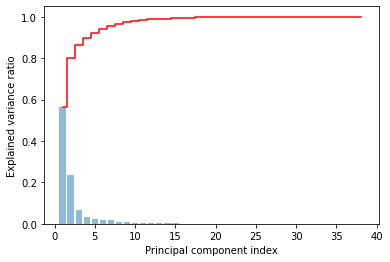

In [20]:
# make a bar plot of the variance associated with each component
import matplotlib.pyplot as plt

plt.bar(range(1,39), var_exp, alpha=0.5, align='center',
        label='Individual explained variance')
plt.step(range(1,39), cum_var_exp, where='mid',
         label='Cumulative explained variance',
         color='red')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.show()

In [21]:
#https://github.com/benjamin-hg-marchant/ml-gp-modis-multilayer-clouds#selected_modis_band
#https://github.com/benjamin-hg-marchant/ml-dl-modis-multilayer-clouds/blob/master/docs/dl_monolayer_liquid_and_ice_clouds.ipynb
#https://www.thejuliagroup.com/blog/factor-analysis-and-eigenvalues/#:~:text=An%20eigenvalue%20is%20the%20total%20amount%20of%20variance,Or%2C%20possibly%2C%20I%E2%80%99ll%20blog%20about%20it%20next%20week.%29

In [22]:
#https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html

### PCA sklearn


In [23]:
from IPython.display import Image, display
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np

In [24]:
# PCA sklearn
from sklearn.decomposition import PCA

pca = PCA()
# fit_transform() is used to calculate the PCAs from training data
X_train_pca = pca.fit_transform(X_scaled)
print(X_train_pca.shape)
# to get the fit statistics (variance explained per component)
print("sklearn var:\n", pca.explained_variance_ratio_)
print("numpy var: \n", EigVal/sum(EigVal))

(240000, 38)
sklearn var:
 [5.630e-01 2.362e-01 6.571e-02 3.341e-02 2.083e-02 1.910e-02 1.647e-02
 9.232e-03 8.418e-03 5.582e-03 5.151e-03 3.530e-03 2.658e-03 2.041e-03
 1.795e-03 1.323e-03 1.271e-03 9.345e-04 7.222e-04 6.730e-04 5.974e-04
 3.855e-04 2.667e-04 2.352e-04 1.253e-04 8.612e-05 6.608e-05 4.875e-05
 4.018e-05 2.235e-05 1.775e-05 1.263e-05 9.646e-06 5.894e-06 5.222e-06
 3.666e-06 3.320e-06 1.555e-06]
numpy var: 
 [5.630e-01 2.362e-01 6.571e-02 3.341e-02 2.083e-02 1.910e-02 1.647e-02
 9.232e-03 8.418e-03 5.582e-03 5.151e-03 3.530e-03 2.658e-03 2.041e-03
 1.795e-03 1.323e-03 1.271e-03 9.345e-04 7.222e-04 6.730e-04 5.974e-04
 3.855e-04 2.667e-04 2.352e-04 1.253e-04 8.612e-05 6.608e-05 4.875e-05
 4.018e-05 2.235e-05 1.775e-05 1.263e-05 9.646e-06 5.894e-06 5.222e-06
 3.666e-06 3.320e-06 1.555e-06]


In [25]:
print("Eigen vectors:",pca.components_)
print("Eigen values:",pca.explained_variance_)

Eigen vectors: [[-1.795e-01 -1.357e-01 -1.831e-01 ...  1.904e-01  1.882e-01  1.120e-02]
 [-1.099e-01 -8.414e-02 -9.664e-02 ... -1.368e-01 -1.403e-01 -9.154e-03]
 [ 2.694e-01  3.101e-01  2.671e-01 ...  1.227e-01  1.270e-01  1.397e-02]
 ...
 [ 5.890e-02 -6.471e-05 -9.625e-02 ... -1.228e-01 -3.594e-02  4.669e-05]
 [-2.656e-02  1.664e-04 -2.683e-02 ...  1.572e-01  3.799e-02 -5.550e-04]
 [-4.525e-01 -4.488e-04 -3.546e-01 ... -9.629e-03 -1.030e-02 -3.508e-04]]
Eigen values: [2.140e+01 8.975e+00 2.497e+00 1.270e+00 7.915e-01 7.258e-01 6.258e-01
 3.508e-01 3.199e-01 2.121e-01 1.958e-01 1.341e-01 1.010e-01 7.755e-02
 6.821e-02 5.029e-02 4.829e-02 3.551e-02 2.744e-02 2.557e-02 2.270e-02
 1.465e-02 1.013e-02 8.936e-03 4.760e-03 3.273e-03 2.511e-03 1.852e-03
 1.527e-03 8.492e-04 6.745e-04 4.800e-04 3.665e-04 2.240e-04 1.984e-04
 1.393e-04 1.262e-04 5.907e-05]


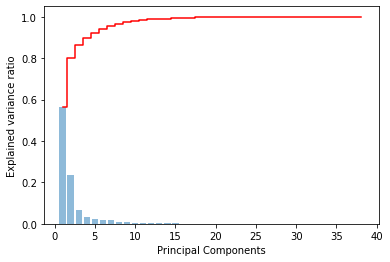

In [26]:
# like we did above visualize the PCs 
# and the cumulative variance explained by each PC

plt.bar(range(1,39), pca.explained_variance_ratio_,
        alpha=0.5,
        align='center')
plt.step(range(1,39), np.cumsum(pca.explained_variance_ratio_),
         where='mid',
         color='red')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal Components')
plt.show()

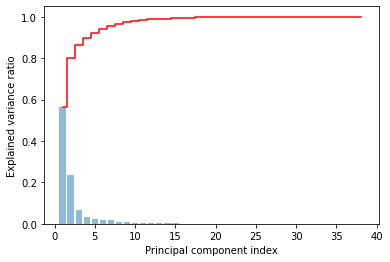

In [27]:
# make a bar plot of the variance associated with each component
import matplotlib.pyplot as plt

plt.bar(range(1,39), var_exp, alpha=0.5, align='center',
        label='Individual explained variance')
plt.step(range(1,39), cum_var_exp, where='mid',
         label='Cumulative explained variance',
         color='red')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.show()

me puedo quedar con los 4 primeros

In [28]:
## ejemplo si elijo 9 componentes
pca9=PCA(n_components=9)
pca9.fit(X_scaled)
Xpca9 = pca9.transform(X_scaled)
print("Projected data")
print(Xpca9)

Projected data
[[-1.680e+00  3.155e-01  4.987e-03 ...  7.841e-01 -2.133e-02  6.667e-01]
 [-1.997e+00  5.114e-01 -9.103e-02 ...  6.844e-01 -2.232e-03  6.388e-01]
 [-2.023e+00  5.536e-01 -1.507e-01 ...  6.713e-01  2.985e-02  5.921e-01]
 ...
 [ 1.152e+01  8.655e+00  2.169e+00 ... -7.698e-01  1.312e-01  2.319e-03]
 [ 1.149e+01  8.662e+00  2.163e+00 ... -7.676e-01  1.102e-01  4.558e-02]
 [ 1.150e+01  8.673e+00  2.172e+00 ... -7.713e-01  1.103e-01  5.010e-02]]


In [29]:
print(f" sum of explained variance ratios of the 9 PCs : {sum(pca9.explained_variance_ratio_)}")


 sum of explained variance ratios of the 9 PCs : 0.9723858935171638


### Reconstruct the image and visualize


In [30]:
X_out_9_reduced = np.zeros((img_shape[0],img_shape[1],n_bands))
print(Xpca9.shape)

X_inv = pca9.inverse_transform(Xpca9)
print(X_inv.shape)

inversed_9 = scaler.inverse_transform(X_inv)
print(Xpca9.shape)

for i in range(n_bands):
    X_out_9_reduced[:,:,i] = inversed_9[:,i].reshape(-1,img_shape[1])
    
    
X_out_9_reduced.shape
###only to visualize the image reduced show is really close to the original

(240000, 9)
(240000, 38)
(240000, 9)


(600, 400, 38)

In [31]:
print(Xpca9.shape)

(240000, 9)


#### Plot channels after PCA

In [32]:
X_out = np.zeros((img_shape[0],img_shape[1],n_bands))
print(X_train_pca.shape)
inversed = scaler.inverse_transform(X_train_pca)

for i in range(n_bands):
    X_out[:,:,i] = inversed[:,i].reshape(-1,img_shape[1])
    

X_out.shape


(240000, 38)


(600, 400, 38)

In [33]:

X_out = np.zeros((img_shape[0],img_shape[1],n_bands))

inversed = scaler.inverse_transform(PC)

for i in range(n_bands):
    X_out[:,:,i] = inversed[:,i].reshape(-1,img_shape[1])
    

X_out.shape


(600, 400, 38)

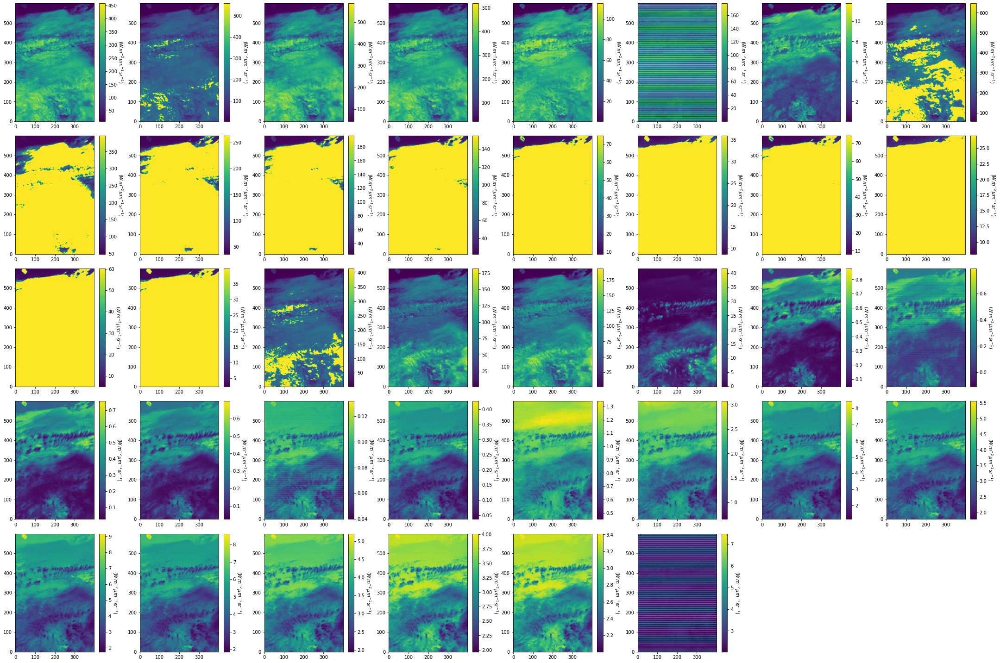

In [34]:
fig,axes = plt.subplots(5,8,figsize = (30,20))
axes = axes.ravel()
fig.subplots_adjust(wspace=0.2, hspace=0.15)
n_bands_sample=38 #7
for i in range(n_bands_sample):
    pcm = axes[i].imshow(np.fliplr(df_train[i,:,:]),  origin='lower') #interpolation='nearest'
    #pcm=axes[i].imshow(np.fliplr(X_out[:,:,i]),  origin='lower',cmap='gray', vmin=0, vmax=255)

    cbar=fig.colorbar(pcm, ax=axes[i])
    cbar.ax.get_yaxis().labelpad = 15
    cbar.set_label('$(W\,m^{-2}\,\mu m^{-1}\,sr^{-1})$ \n \n', rotation=270)

    #out2=cax.ax.set_ylabel('$(W\,m^{-2}\,\mu m^{-1}\,sr^{-1})$ \n \n')
    #out2.set_rotation(270)
    #axes[i].set_title('Radiances \n in channel %0.1f'% (band_list['band_'+x][n_bands]))
fig.delaxes(axes[-1])
fig.delaxes(axes[-2])
plt.tight_layout()
fig.savefig("Before_PCA_MODIS_radiances_by_channel.png")  


decidir cual usar de los siguiente pc o el otro

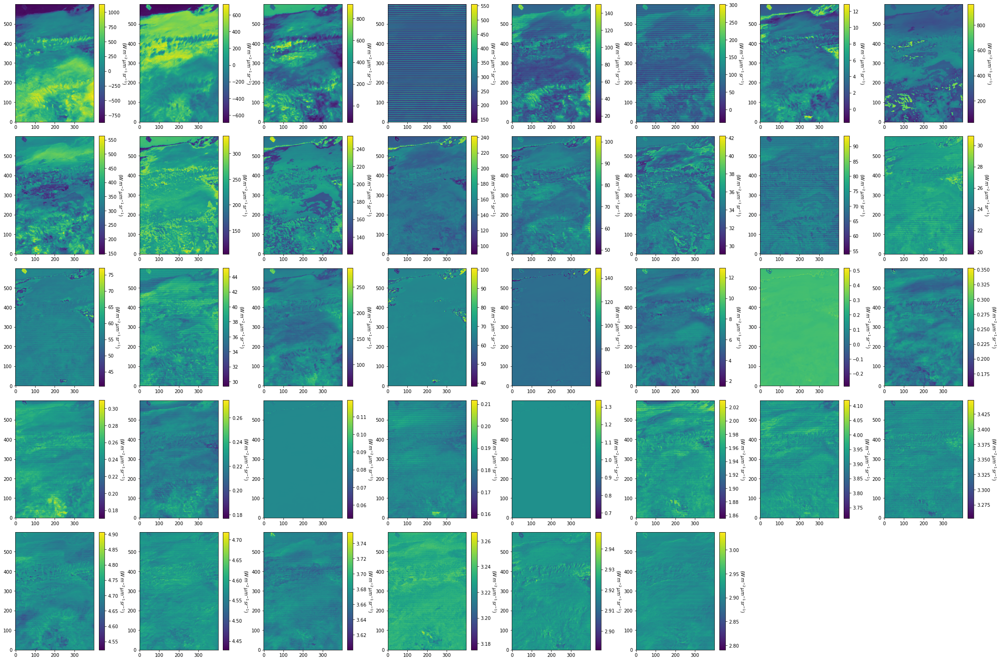

In [35]:
#PC
fig,axes = plt.subplots(5,8,figsize = (30,20))
axes = axes.ravel()
fig.subplots_adjust(wspace=0.2, hspace=0.15)
n_bands_sample=38 #7
for i in range(n_bands_sample):
    pcm = axes[i].imshow(np.fliplr(X_out[:,:,i]),  origin='lower') #interpolation='nearest'
    #pcm=axes[i].imshow(np.fliplr(X_out[:,:,i]),  origin='lower',cmap='gray', vmin=0, vmax=255)

    cbar=fig.colorbar(pcm, ax=axes[i])
    cbar.ax.get_yaxis().labelpad = 15
    cbar.set_label('$(W\,m^{-2}\,\mu m^{-1}\,sr^{-1})$ \n \n', rotation=270)

    #out2=cax.ax.set_ylabel('$(W\,m^{-2}\,\mu m^{-1}\,sr^{-1})$ \n \n')
    #out2.set_rotation(270)
    #axes[i].set_title('Radiances \n in channel %0.1f'% (band_list['band_'+x][n_bands]))
fig.delaxes(axes[-1])
fig.delaxes(axes[-2])
plt.tight_layout()
#fig.savefig("After_PCA_MODIS_radiances_by_channel.png")  


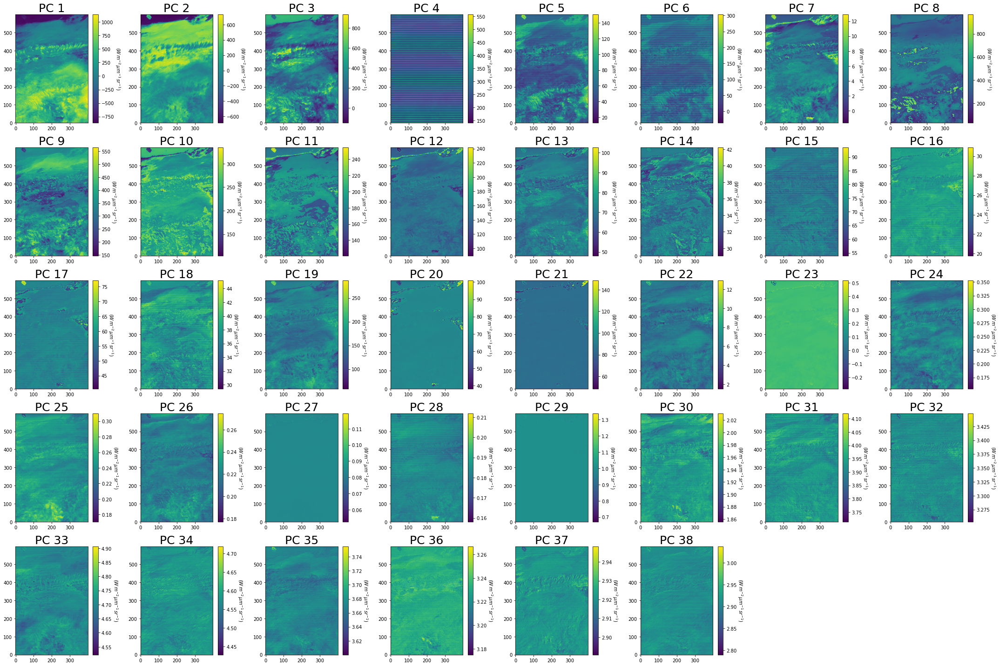

In [36]:
fig,axes = plt.subplots(5,8,figsize = (30,20))
axes = axes.ravel()
fig.subplots_adjust(wspace=0.2, hspace=0.15)


n_bands_sample=38 #7
for i in range(n_bands_sample):
    pcm = axes[i].imshow(np.fliplr(X_out[:,:,i]),  origin='lower') #interpolation='nearest'
    #pcm=axes[i].imshow(np.fliplr(X_out[:,:,i]),  origin='lower',cmap='gray', vmin=0, vmax=255)

    cbar=fig.colorbar(pcm, ax=axes[i])
    cbar.ax.get_yaxis().labelpad = 15
    cbar.set_label('$(W\,m^{-2}\,\mu m^{-1}\,sr^{-1})$ \n \n', rotation=270)
    axes[i].set_title('PC '+str(i+1),fontsize=25)
fig.delaxes(axes[-1])
fig.delaxes(axes[-2])
plt.tight_layout()
fig.savefig("After_PCA_MODIS_radiances_by_channel.png")  


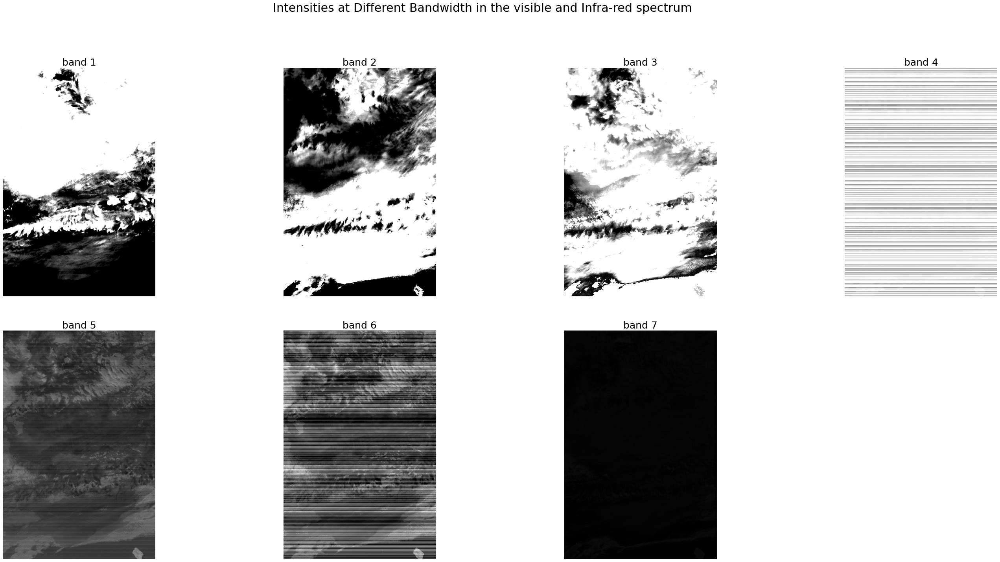

In [37]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as grid

fig,axes = plt.subplots(2,4,figsize=(50,23),sharex='all', sharey='all')
fig.subplots_adjust(wspace=0.1, hspace=0.15)
fig.suptitle('Intensities at Different Bandwidth in the visible and Infra-red spectrum', fontsize=30)
axes = axes.ravel()
n_bands_sample =7
for i in range(n_bands_sample):
    axes[i].imshow(X_out[:,:,i],cmap='gray', vmin=0, vmax=255)
    axes[i].set_title('band '+str(i+1),fontsize=25)
    axes[i].axis('off')
fig.delaxes(axes[-1])

In [38]:
import pandas as pd  #https://plotly.com/python/pca-visualization/
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.datasets import load_boston

#boston = load_boston()
df = MB_matrix[:4,:500] #pd.DataFrame(boston.data, columns=boston.feature_names)
n_components = 4

pca = PCA(n_components=n_components)
components = pca.fit_transform(df)

total_var = pca.explained_variance_ratio_.sum() * 100

labels = {str(i): f"PC {i+1}" for i in range(n_components)}
labels['color'] = 'Median Price'

fig = px.scatter_matrix(
    components,
    #color=boston.target,
    dimensions=range(n_components),
    labels=labels,
    title=f'Total Explained Variance: {total_var:.2f}%',
)
fig.update_traces(diagonal_visible=False)
fig.show()

NameError: name 'MB_matrix' is not defined

In [ ]:
import pandas as pd  #https://plotly.com/python/pca-visualization/
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.datasets import load_boston

#boston = load_boston()
df = MB_matrix[:4,:500] #pd.DataFrame(boston.data, columns=boston.feature_names)
n_components = 4

pca = PCA(n_components=n_components)
components = pca.fit_transform(df)

total_var = pca.explained_variance_ratio_.sum() * 100

labels = {str(i): f"PC {i+1}" for i in range(n_components)}
labels['color'] = 'Median Price'

fig = px.scatter_matrix(
    components,
    #color=boston.target,
    dimensions=range(n_components),
    labels=labels,
    title=f'Total Explained Variance: {total_var:.2f}%',
)
fig.update_traces(diagonal_visible=False)
fig.show()

### other methods 

In [ ]:
from sklearn.manifold import TSNE
from sklearn import manifold

##############
######
#ISOMAP
######
##############

iso = manifold.Isomap(n_neighbors=6, n_components=2)
iso.fit(MB_matrix)
manifold_iso_data = iso.transform(MB_matrix)

In [ ]:
from sklearn.datasets import make_swiss_roll
n_samples = 2500
X, color = make_swiss_roll(n_samples)

In [ ]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(2, 1, 1,projection='3d')
ax.set_title('Here is the swiss roll maniflod', fontsize=10)
ax.scatter(X[:,0],X[:,1],X[:,2],c = color,cmap="Accent",s=60)
x = X[:,0][2:2500] 
y = X[:,1][2:2500] # Just as abovve, this time for column 1
ax.scatter(x,y,c = "black") #Now we randomly plot this in both 3D manifold (this may not be clearly visible as the  existing
ax.plot(x[2:4],y[2:4],c = "red")
ax = fig.add_subplot(2, 1, 2) 
#Now we plot 2D after ISOMAP...
ax.set_title('When compressing with ISOMAP', fontsize=10)
ax.scatter(manifold_iso_data[:,0],manifold_iso_data[:,1],c = color,cmap="Accent",s=60)
x = X[:,0][2:2500]#Now we plot the same 'black' samples, after ISOMAP in 2D and observe the distance in 2D.
y = X[:,1][2:2500]
ax.scatter(x,y,c = "black")
ax.plot(x[2:4],y[2:4],c = "red")
plt.show()

In [ ]:
#print(f'scale: {ch30_scale}, offset: {ch30_offset}')

In [ ]:
# Subset data. check  https://hdfeos.org/zoo/index_openLAADS_Examples.php
#data = data_raw[0,:,:].astype(np.double)
#np.shape(data)

In [ ]:
#debo trabajar con radiances o q?

In [ ]:
https://oceancolor.gsfc.nasa.gov/forum/oceancolor/topic_show.pl?tid=1049  #info about lat,lon
    https://stackoverflow.com/questions/29135885/netcdf4-extract-for-subset-of-lat-lon

In [ ]:
#PCA
https://www.sciencedirect.com/science/article/abs/pii/S0957417420301020
    https://link.springer.com/article/10.1007/s12524-018-0803-1  #'GET THE PAPER'++
        
        https://medium.com/analytics-vidhya/principal-component-analysis-pca-with-code-on-mnist-dataset-da7de0d07c22 #reader

In [ ]:
# more pca https://www.kaggle.com/akhileshrai/intro-cnn-pytorch-pca-tnse-isomap

In [ ]:
https://towardsdatascience.com/principal-component-analysis-in-depth-understanding-through-image-visualization-892922f77d9f

In [ ]:
    https://notebook.community/dennissergeev/classcode/notebooks/01_MODIS_L1B
    http://colah.github.io/posts/2014-10-Visualizing-MNIST/

In [ ]:
https://www.earthdatascience.org/courses/use-data-open-source-python/multispectral-remote-sensing/modis-data-in-python/
    https://towardsdatascience.com/pca-with-numpy-58917c1d0391
    https://towardsdatascience.com/dimensionality-reduction-of-a-color-photo-splitting-into-rgb-channels-using-pca-algorithm-in-python-ba01580a1118
        https://jakevdp.github.io/PythonDataScienceHandbook/04.07-customizing-colorbars.html
            https://ccplot.org/pub/resources/Aqua/MODIS%20Level%201B%20Product%20User%20Guide.pdf
                https://modis.gsfc.nasa.gov/about/specifications.php

In [ ]:
Histograma https://www.geeksforgeeks.org/plot-2-d-histogram-in-python-using-matplotlib/

https://www.youtube.com/watch?v=g-Hb26agBFg


In [ ]:
https://github.com/Sunjjjjjj/AAI_simulator_py2/blob/master/MODIS_rgb.py
    https://github.com/Sunjjjjjj/AAI_simulator_py2/blob/master/MODIS_combine.py
        https://github.com/Sunjjjjjj/AAI_simulator_py2/blob/master/MODIS_wget.py

In [ ]:
!ncks -d Longitude,4.5.,14.496. -d Latitude,47.5.,47.5.  MYD021KM.A2013122.1140.061.2018046032403.hdf  subset_MYD021KM.A2013122.1140.061.2018046032403.hdf


In [ ]:
!ncdump -h MYD021KM.A2013122.1140.061.2018046032403.hdf


In [ ]:
np.shape(latitude)
plt.scatter(latitude[0], latitude[1], alpha=0.5)
plt.title('Scatter plot latitude')
plt.xlabel('x')
plt.ylabel('y')
plt.show()

In [ ]:
https://av.tib.eu/media/15573  conda install -c hcc pymodis #http://www.pymodis.org/

info https://modaps.modaps.eosdis.nasa.gov/services/about/product_descriptions_aqua.html
https://bpostance.github.io/posts/working-with-MODIS-data/
mdois geo https://www.icare.univ-lille.fr/modis-geolocation/

In [ ]:
#seaborn 
https://seaborn.pydata.org/tutorial/distributions.html